In [79]:
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
plt.rcParams['figure.figsize'] = [10,6]
from scipy.spatial.distance import euclidean
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFECV
from sklearn.metrics import mean_squared_error, r2_score
from scipy.special import boxcox1p
from statsmodels.stats.outliers_influence import variance_inflation_factor



In [49]:
df = pd.read_csv('Data/song_data.csv')

## EDA

In [50]:
df.drop(['song_name'], axis=1, inplace=True)

target = 'song_popularity'
features = [i for i in df.columns if i not in [target]]

original_df = df.copy(deep=True)

df.head()


,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_popularity   18835 non-null  int64  
 1   song_duration_ms  18835 non-null  int64  
 2   acousticness      18835 non-null  float64
 3   danceability      18835 non-null  float64
 4   energy            18835 non-null  float64
 5   instrumentalness  18835 non-null  float64
 6   key               18835 non-null  int64  
 7   liveness          18835 non-null  float64
 8   loudness          18835 non-null  float64
 9   audio_mode        18835 non-null  int64  
 10  speechiness       18835 non-null  float64
 11  tempo             18835 non-null  float64
 12  time_signature    18835 non-null  int64  
 13  audio_valence     18835 non-null  float64
dtypes: float64(9), int64(5)
memory usage: 2.0 MB


In [52]:
df.nunique().sort_values()

audio_mode              2
time_signature          5
key                    12
song_popularity       101
danceability          849
energy               1132
speechiness          1224
audio_valence        1246
liveness             1425
acousticness         3209
instrumentalness     3925
loudness             8416
song_duration_ms    11771
tempo               12112
dtype: int64

In [53]:
df.describe()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
count,18835.000000,1.883500e+04,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000
mean,52.991877,2.182116e+05,0.258539,0.633348,0.644995,0.078008,5.289196,0.179650,-7.447435,0.628139,0.102099,121.073154,3.959119,0.527967
std,21.905654,5.988754e+04,0.288719,0.156723,0.214101,0.221591,3.614595,0.143984,3.827831,0.483314,0.104378,28.714456,0.298533,0.244632
min,0.000000,1.200000e+04,0.000001,0.000000,0.001070,0.000000,0.000000,0.010900,-38.768000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,40.000000,1.843395e+05,0.024100,0.533000,0.510000,0.000000,2.000000,0.092900,-9.044000,0.000000,0.037800,98.368000,4.000000,0.335000
50%,56.000000,2.113060e+05,0.132000,0.645000,0.674000,0.000011,5.000000,0.122000,-6.555000,1.000000,0.055500,120.013000,4.000000,0.527000
75%,69.000000,2.428440e+05,0.424000,0.748000,0.815000,0.002570,8.000000,0.221000,-4.908000,1.000000,0.119000,139.931000,4.000000,0.725000
max,100.000000,1.799346e+06,0.996000,0.987000,0.999000,0.997000,11.000000,0.986000,1.585000,1.000000,0.941000,242.318000,5.000000,0.984000


### Target Variable

/var/folders/dq/sptc86px36g5fbb_9g_bhzrh0000gn/T/ipykernel_99764/3890255969.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[target], color='b',hist_kws=dict(edgecolor="black", linewidth=2), bins=30)


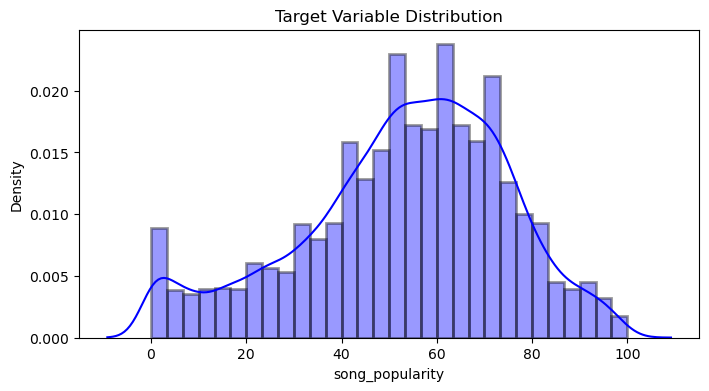

In [54]:
plt.figure(figsize=[8,4])
sns.distplot(df[target], color='b',hist_kws=dict(edgecolor="black", linewidth=2), bins=30)
plt.title('Target Variable Distribution')
plt.show()

In [55]:
nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; 

for i in range(df[features].shape[1]):
    if nu.values[i]<=16:cf.append(nu.index[i])
    else: nf.append(nu.index[i])

print('\n\033[1mInference:\033[0m The Datset has {} numerical & {} categorical features.'.format(len(nf),len(cf)))


Inference: The Datset has 10 numerical & 3 categorical features.


In [56]:
cf

['audio_mode', 'time_signature', 'key']

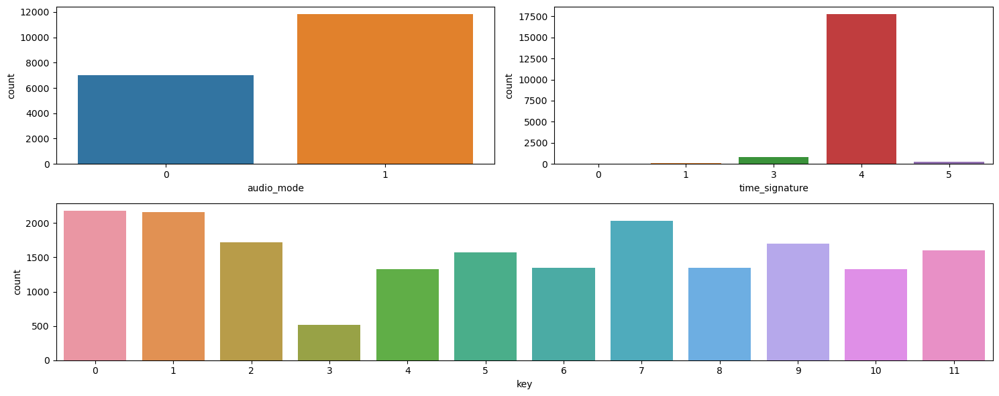

In [57]:
n=2
plt.figure(figsize=[15,3*math.ceil(len(cf)/n)])

for i in range(len(cf)):
    if df[cf[i]].nunique() <= 8:
        plt.subplot(math.ceil(len(cf)/n),n,i+1)
        sns.countplot(df, x=cf[i])
    else:
        plt.subplot(2,1,2)
        sns.countplot(df, x=cf[i])
    

plt.tight_layout()
plt.show()

/var/folders/dq/sptc86px36g5fbb_9g_bhzrh0000gn/T/ipykernel_99764/2029610166.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[nf[i]],hist_kws=dict(edgecolor="black", linewidth=2), bins=10, color=list(np.random.randint([255,255,255])/255))
/var/folders/dq/sptc86px36g5fbb_9g_bhzrh0000gn/T/ipykernel_99764/2029610166.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https

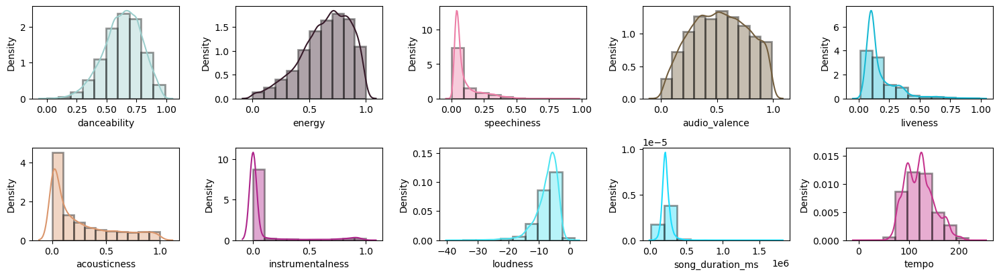

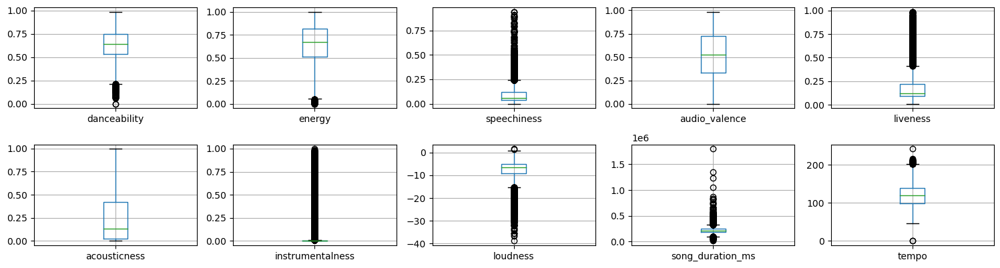

In [58]:

n=5

clr=['r','g','b','g','b','r']

plt.figure(figsize=[15,4*math.ceil(len(nf)/n)])
for i in range(len(nf)):
    plt.subplot(math.ceil(len(nf)/3),n,i+1)
    sns.distplot(df[nf[i]],hist_kws=dict(edgecolor="black", linewidth=2), bins=10, color=list(np.random.randint([255,255,255])/255))
plt.tight_layout()
plt.show()

plt.figure(figsize=[15,4*math.ceil(len(nf)/n)])
for i in range(len(nf)):
    plt.subplot(math.ceil(len(nf)/3),n,i+1)
    df.boxplot(nf[i])
plt.tight_layout()
plt.show()

/Users/owner/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


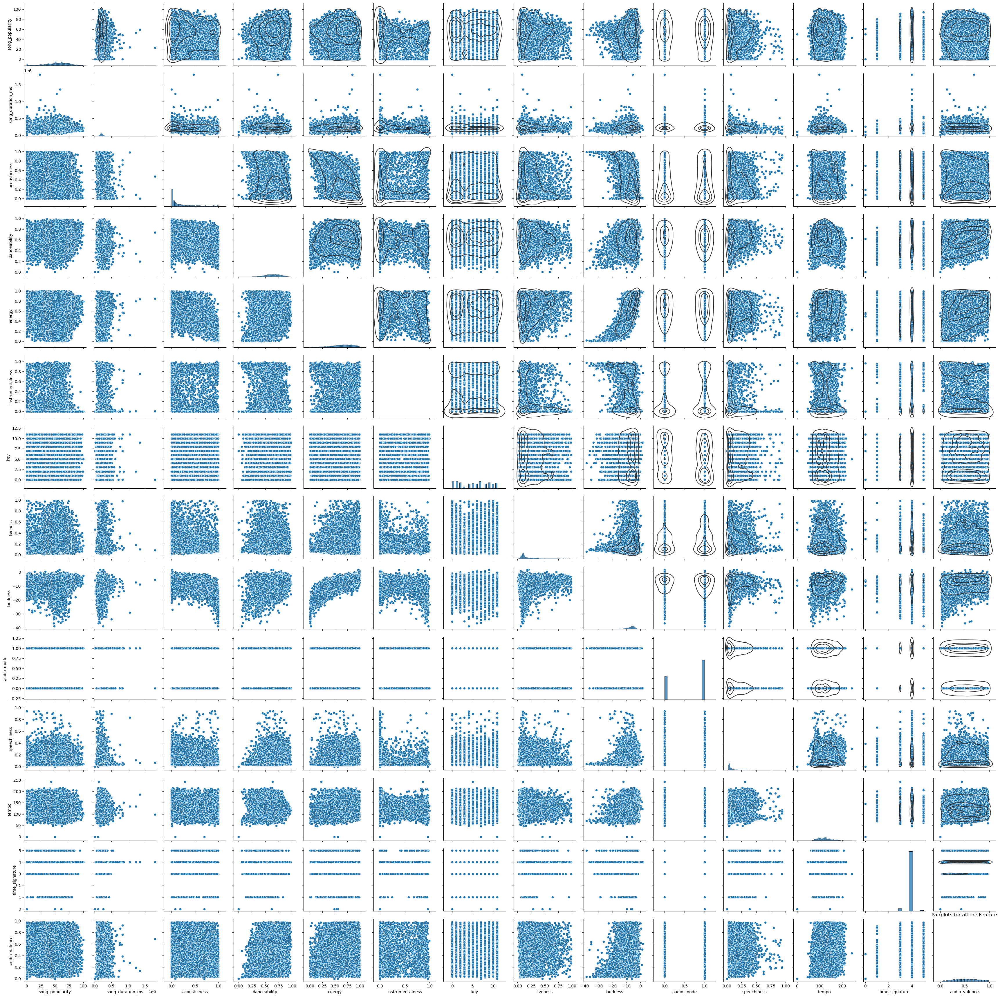

In [59]:
g = sns.pairplot(df)
plt.title('Pairplots for all the Feature')
g.map_upper(sns.kdeplot, levels=4, color=".2")
plt.show()

In [60]:
df.drop_duplicates(inplace=True)

In [61]:
pd.DataFrame(df.isnull().sum().sort_values(), columns=['Total Null Values'])

,Total Null Values
song_popularity,0
song_duration_ms,0
acousticness,0
danceability,0
energy,0
instrumentalness,0
key,0
liveness,0
loudness,0
audio_mode,0


In [187]:
data = pd.read_csv('Data/song_data.csv')

data = data.drop(columns=['song_name'])
data = pd.get_dummies(data, columns=['key', 'time_signature'], drop_first=True)
data['audio_mode'] = data['audio_mode'].apply(lambda x: 1 if x == 'major' else 0)
data = data.drop_duplicates()

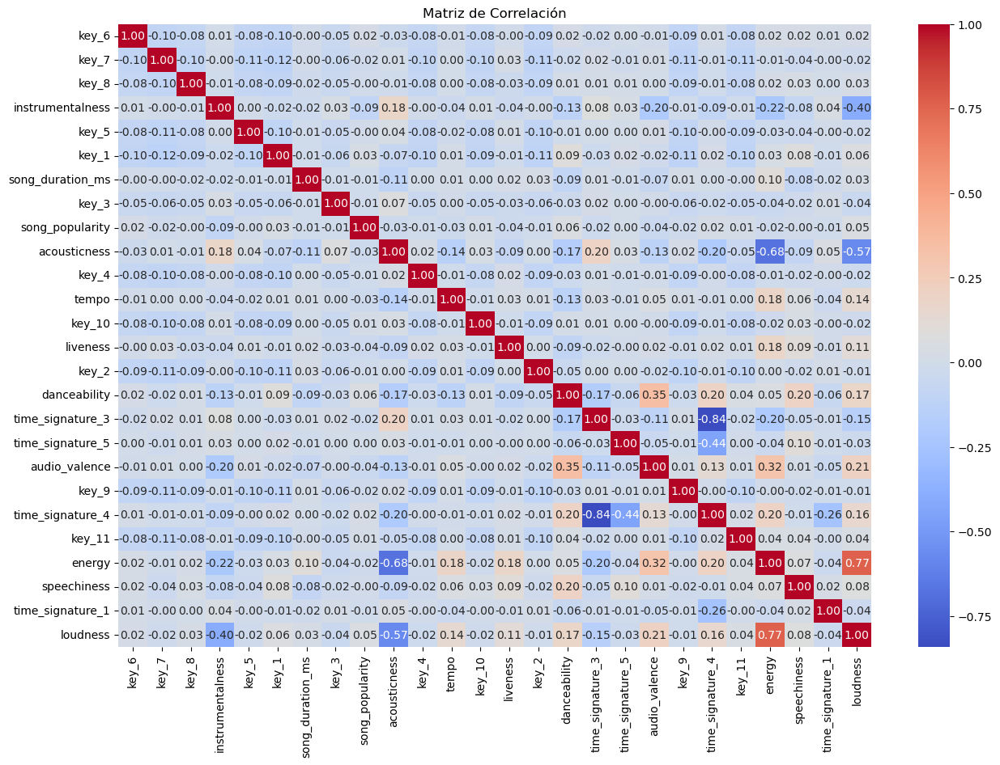

In [188]:
data = data.loc[:, (data != data.iloc[0]).any()]

numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()

dummy_columns = [col for col in data.columns if 'key_' in col or 'time_signature_' in col]
numeric_features = list(set(numeric_features + dummy_columns))

if 'audio_mode' not in numeric_features:
    numeric_features.append('audio_mode')

numeric_features = [col for col in numeric_features if col in data.columns]

corr_matrix = data[numeric_features].corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Matriz de Correlación')
plt.show()




In [189]:
numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()

dummy_columns = [col for col in data.columns if 'key_' in col or 'time_signature_' in col]
numeric_features = list(set(numeric_features + dummy_columns))

if 'audio_mode' not in numeric_features:
    numeric_features.append('audio_mode')

data = data.loc[:, (data != data.iloc[0]).any()]

numeric_features = [col for col in numeric_features if col in data.columns]

data[numeric_features] = data[numeric_features].apply(pd.to_numeric, errors='coerce')
data[numeric_features] = data[numeric_features].astype(np.float64)

data = data.dropna()

data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)

print("Valores infinitos:", np.isinf(data[numeric_features]).values.any())
print("Valores NaN:", data[numeric_features].isna().values.any())

X = data[numeric_features].drop(columns=['song_popularity'], errors='ignore')
X = sm.add_constant(X)

try:
    vif_data = pd.DataFrame()
    vif_data['Feature'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    print(vif_data)
except Exception as e:
    print(f"Error en el cálculo del VIF: {e}")

Valores infinitos: False
Valores NaN: False
             Feature          VIF
0              const  5058.351944
1              key_6     1.498175
2              key_7     1.739351
3              key_8     1.500607
4   instrumentalness     1.264816
5              key_5     1.581506
6              key_1     1.741241
7   song_duration_ms     1.046499
8              key_3     1.219697
9       acousticness     2.055476
10             key_4     1.508997
11             tempo     1.077739
12            key_10     1.497233
13          liveness     1.062868
14             key_2     1.641316
15      danceability     1.455687
16  time_signature_3   219.633002
17  time_signature_5    65.434376
18     audio_valence     1.417458
19             key_9     1.644562
20  time_signature_4   297.965976
21            key_11     1.575031
22            energy     3.905727
23       speechiness     1.113964
24  time_signature_1    23.315120
25          loudness     3.029127


In [190]:
variables_a_eliminar = ['time_signature_3', 'time_signature_5', 'time_signature_1']

# Eliminar las variables identificadas
data = data.drop(columns=variables_a_eliminar)

# Recalcular VIF después de eliminar las variables problemáticas
X = data.drop(columns=['song_popularity'], errors='ignore')
X = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Mostrar el resultado del análisis de VIF después de eliminar variables problemáticas
print(vif_data)

# Si energy y loudness todavía tienen VIF altos, considerar eliminarlos o investigar su relación
vif_altos = vif_data[vif_data['VIF'] > 10]
if not vif_altos.empty:
    print("Variables con VIF altos después de eliminar time_signature:")
    print(vif_altos)

             Feature         VIF
0              const  153.728408
1   song_duration_ms    1.045307
2       acousticness    2.052822
3       danceability    1.453537
4             energy    3.901829
5   instrumentalness    1.264104
6           liveness    1.062201
7           loudness    3.028007
8        speechiness    1.102014
9              tempo    1.071951
10     audio_valence    1.417236
11             key_1    1.740801
12             key_2    1.641056
13             key_3    1.219605
14             key_4    1.508769
15             key_5    1.581325
16             key_6    1.497982
17             key_7    1.738977
18             key_8    1.500425
19             key_9    1.644219
20            key_10    1.497008
21            key_11    1.575006
22  time_signature_4    1.093188
Variables con VIF altos después de eliminar time_signature:
  Feature         VIF
0   const  153.728408


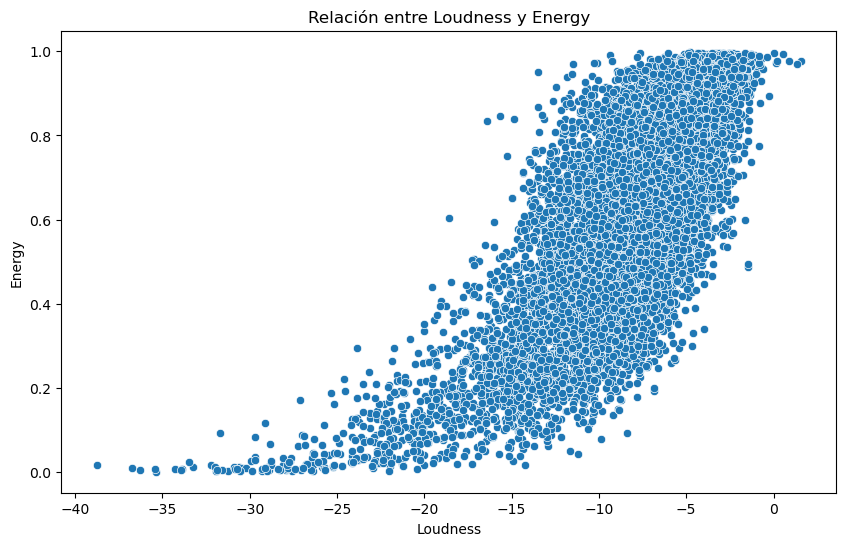

Coeficiente de correlación entre Loudness y Energy: 0.77


In [191]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='loudness', y='energy', data=data)
plt.title('Relación entre Loudness y Energy')
plt.xlabel('Loudness')
plt.ylabel('Energy')
plt.show()
correlation = data[['loudness', 'energy']].corr().iloc[0, 1]
print(f"Coeficiente de correlación entre Loudness y Energy: {correlation:.2f}")

In [192]:
data['loudness_energy'] = data['energy']/data['loudness']

data_combined = data.drop(columns=['loudness', 'energy'])
X = data_combined.drop(columns=['song_popularity'], errors='ignore')
X = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("VIF después de combinar 'loudness' y 'energy':")
print(vif_data)

VIF después de combinar 'loudness' y 'energy':
             Feature        VIF
0              const  88.350101
1   song_duration_ms   1.037044
2       acousticness   1.197467
3       danceability   1.331799
4   instrumentalness   1.078580
5           liveness   1.041462
6        speechiness   1.097696
7              tempo   1.065042
8      audio_valence   1.210884
9              key_1   1.739552
10             key_2   1.640635
11             key_3   1.219449
12             key_4   1.508332
13             key_5   1.581255
14             key_6   1.497385
15             key_7   1.739236
16             key_8   1.498606
17             key_9   1.643930
18            key_10   1.496585
19            key_11   1.574605
20  time_signature_4   1.081619
21   loudness_energy   1.050849


In [193]:
data

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,...,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,time_signature_4,loudness_energy
0,73.0,262333.0,0.005520,0.496,0.682,0.000029,0.0589,-4.095,0.0294,167.060,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.166545
1,66.0,216933.0,0.010300,0.542,0.853,0.000000,0.1080,-6.407,0.0498,105.256,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.133136
2,76.0,231733.0,0.008170,0.737,0.463,0.447000,0.2550,-7.828,0.0792,123.881,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.059147
3,74.0,216933.0,0.026400,0.451,0.970,0.003550,0.1020,-4.938,0.1070,122.444,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.196436
4,56.0,223826.0,0.000954,0.447,0.766,0.000000,0.1130,-5.065,0.0313,172.011,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.151234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18830,60.0,159645.0,0.893000,0.500,0.151,0.000065,0.1110,-16.107,0.0348,113.969,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,-0.009375
18831,60.0,205666.0,0.765000,0.495,0.161,0.000001,0.1050,-14.078,0.0301,94.286,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,-0.011436
18832,23.0,182211.0,0.847000,0.719,0.325,0.000000,0.1250,-12.222,0.0355,130.534,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.026591
18833,55.0,352280.0,0.945000,0.488,0.326,0.015700,0.1190,-12.020,0.0328,106.063,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.027121


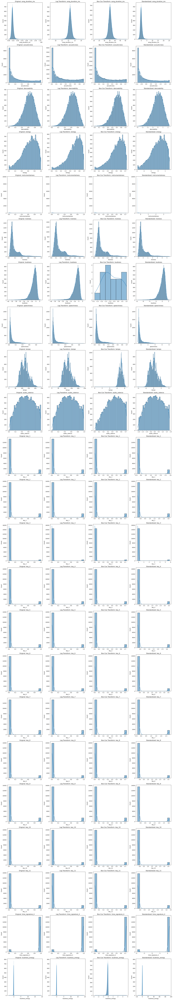

Original Data
                    count           mean           std           min  \
song_duration_ms  14924.0  218949.435808  62344.950022  12000.000000   
acousticness      14924.0       0.270472      0.298129      0.000001   
danceability      14924.0       0.624554      0.158052      0.000000   
energy            14924.0       0.639730      0.221753      0.001070   
instrumentalness  14924.0       0.092079      0.240465      0.000000   
liveness          14924.0       0.180430      0.145098      0.010900   
loudness          14924.0      -7.677764      4.018656    -38.768000   
speechiness       14924.0       0.099402      0.103539      0.000000   
tempo             14924.0     121.102567     29.042044      0.000000   
audio_valence     14924.0       0.526963      0.247772      0.000000   
key_1             14924.0       0.106741      0.308794      0.000000   
key_2             14924.0       0.093742      0.291479      0.000000   
key_3             14924.0       0.029014      0.16

In [194]:
from scipy.special import boxcox1p
from sklearn.preprocessing import StandardScaler

numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()
numeric_features.remove('song_popularity')

numeric_features = [col for col in numeric_features if col in data.columns]

data_log = data.copy()
data_boxcox = data.copy()



for feature in numeric_features:
    if (data[feature] > 0).all():
        data_log[feature] = np.log1p(data[feature])  
    data_boxcox[feature] = boxcox1p(data[feature], 0.15)  

scaler = StandardScaler()
data_scaled = data.copy()
data_scaled[numeric_features] = scaler.fit_transform(data_scaled[numeric_features])


fig, axes = plt.subplots(nrows=len(numeric_features), ncols=4, figsize=(20, len(numeric_features) * 5))
for i, feature in enumerate(numeric_features):
    sns.histplot(data[feature], ax=axes[i, 0], kde=True)
    axes[i, 0].set_title(f'Original: {feature}')
    
    sns.histplot(data_log[feature], ax=axes[i, 1], kde=True)
    axes[i, 1].set_title(f'Log Transform: {feature}')
    
    sns.histplot(data_boxcox[feature], ax=axes[i, 2], kde=True)
    axes[i, 2].set_title(f'Box-Cox Transform: {feature}')
    
    sns.histplot(data_scaled[feature], ax=axes[i, 3], kde=True)
    axes[i, 3].set_title(f'Standardized: {feature}')

plt.tight_layout()
plt.show()

desc_original = data[numeric_features].describe().T
desc_log = data_log[numeric_features].describe().T
desc_boxcox = data_boxcox[numeric_features].describe().T
desc_scaled = data_scaled[numeric_features].describe().T

desc_original['Skewness'] = data[numeric_features].skew()
desc_log['Skewness'] = data_log[numeric_features].skew()
desc_boxcox['Skewness'] = data_boxcox[numeric_features].skew()
desc_scaled['Skewness'] = data_scaled[numeric_features].skew()

desc_original['Kurtosis'] = data[numeric_features].kurtosis()
desc_log['Kurtosis'] = data_log[numeric_features].kurtosis()
desc_boxcox['Kurtosis'] = data_boxcox[numeric_features].kurtosis()
desc_scaled['Kurtosis'] = data_scaled[numeric_features].kurtosis()

print("Original Data")
print(desc_original)
print("\nLog Transformed Data")
print(desc_log)
print("\nBox-Cox Transformed Data")
print(desc_boxcox)
print("\nStandardized Data")
print(desc_scaled)


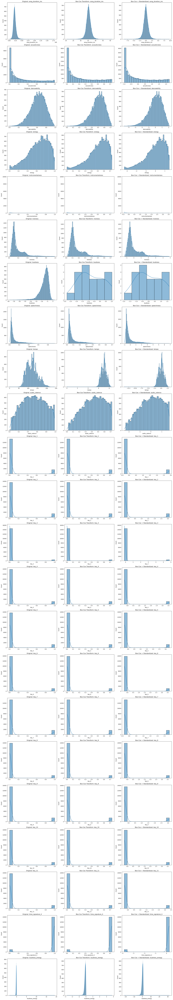

In [195]:
for feature in numeric_features:
    data_boxcox[feature] = boxcox1p(data[feature], 0.15) 

scaler = StandardScaler()
data_boxcox_scaled = data_boxcox.copy()
data_boxcox_scaled[numeric_features] = scaler.fit_transform(data_boxcox_scaled[numeric_features])

data_final = data_boxcox_scaled.copy()
data_final['song_popularity'] = data['song_popularity']

fig, axes = plt.subplots(nrows=len(numeric_features), ncols=3, figsize=(20, len(numeric_features) * 5))
for i, feature in enumerate(numeric_features):
    sns.histplot(data[feature], ax=axes[i, 0], kde=True)
    axes[i, 0].set_title(f'Original: {feature}')
    
    sns.histplot(data_boxcox[feature], ax=axes[i, 1], kde=True)
    axes[i, 1].set_title(f'Box-Cox Transform: {feature}')
    
    sns.histplot(data_boxcox_scaled[feature], ax=axes[i, 2], kde=True)
    axes[i, 2].set_title(f'Box-Cox + Standardized: {feature}')

plt.tight_layout()
plt.show()

In [196]:
data_final = data_final.drop(columns=[ 'loudness', 'energy'])
mean_loudness_energy = data_final['loudness_energy'].mean()
data_final['loudness_energy'].fillna(mean_loudness_energy, inplace=True)

In [197]:
pd.DataFrame(data_final.isnull().sum().sort_values(), columns=['Total Null Values'])

,Total Null Values
song_popularity,0
key_11,0
key_10,0
key_9,0
key_8,0
key_7,0
key_6,0
key_5,0
key_4,0
key_3,0


In [199]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge, Lasso, LinearRegression, RANSACRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import TweedieRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score

X = data_final.drop(columns=['song_popularity'])
y = data_final['song_popularity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'RANSACRegressor': RANSACRegressor(),
    'SVR': SVR(),
    'RandomForestRegressor': RandomForestRegressor(),
    'KernelRidge': KernelRidge(),
    'TweedieRegressor': TweedieRegressor(power=1, alpha=0.5),
    'PolynomialRegression': Pipeline([
        ('poly', PolynomialFeatures(degree=2)),
        ('linear', LinearRegression())
    ])
}

# Entrenar y evaluar cada modelo
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'MSE': mse, 'R²': r2}
    print(f"{name}:\n  MSE: {mse:.2f}\n  R²: {r2:.2f}\n")

results_df = pd.DataFrame(results).T
print(results_df)

LinearRegression:
  MSE: 401.01
  R²: 0.02

Ridge:
  MSE: 401.01
  R²: 0.02

Lasso:
  MSE: 405.44
  R²: 0.01

RANSACRegressor:
  MSE: 725.71
  R²: -0.78

SVR:
  MSE: 406.42
  R²: 0.01

RandomForestRegressor:
  MSE: 402.79
  R²: 0.01

KernelRidge:
  MSE: 2781.62
  R²: -5.81

TweedieRegressor:
  MSE: 400.89
  R²: 0.02

PolynomialRegression:
  MSE: 398.58
  R²: 0.02

                               MSE        R²
LinearRegression        401.009038  0.018591
Ridge                   401.008833  0.018591
Lasso                   405.438508  0.007750
RANSACRegressor         725.711676 -0.776070
SVR                     406.415694  0.005359
RandomForestRegressor   402.792993  0.014225
KernelRidge            2781.624715 -5.807607
TweedieRegressor        400.892997  0.018875
PolynomialRegression    398.576145  0.024545


# -----------------------------------------------------